In [1]:
import glob, os
import pathlib
import json
import yaml
import random

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import collections
from pprint import pprint

%matplotlib inline

In [2]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report

# saving the ML model to pickle file and load it
import pickle

In [3]:
# avoid the module's method call deprecation
try:
    collectionsAbc = collections.abc
except AttributeError:
    collectionsAbc = collections

Configuring Juputer's options to present more things to the output.

In [4]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

# Functions to use

## Function to fully flatten each json file

In [5]:
def flatten_dict_full(d, sep="_"):
    obj = collections.OrderedDict()

    def recurse(t, parent_key=""):
        
        if isinstance(t, list):
            for i in range(len(t)):
                recurse(t[i], parent_key + sep + str(i) if parent_key else str(i))
        elif isinstance(t,dict):
            for k, v in t.items():
                recurse(v, parent_key + sep + k if parent_key else k)
        else:
            obj[parent_key] = t
    recurse(d)

    return obj

## Function to shuffle the data

In [6]:
def shuffle_data(ml_data, config):
    ml_values = ml_data.values
    random.seed(a=config.get("random_seed"))
    random.shuffle(ml_values)
    return ml_values

# Load configuration

In [7]:
with open(os.path.join(os.path.abspath(os.getcwd()), '../configuration.yaml')) as file:
    config_data = yaml.load(file, Loader=yaml.FullLoader)

In [8]:
config_data

{'ground_truth_directory': 'acousticbrainz-datasets',
 'class_dir': 'danceability',
 'train_kind': 'svm',
 'enumeration_columns': ['tonal_chords_key',
  'tonal_chords_scale',
  'tonal_key_key',
  'tonal_key_scale'],
 'remove_columns': ['json_directory', 'track'],
 'exports_directory': 'exports',
 'evaluations_directory': 'evaluations',
 'tracks_in_csv_format': 'tracks_csv',
 'delete_logs': True,
 'log_directory': 'logs',
 'logging_level': 0,
 'pca_n_components': 0.95,
 'grid_kernel': ['poly', 'rbf'],
 'grid_C': [-5, -3, -1, 1, 3, 5, 7, 9, 11],
 'grid_gamma': [3, 1, -1, -3, -5, -7, -9, -11],
 'grid_class_weight': ['balanced', None],
 'k_fold': 5,
 'shuffle': True,
 'random_seed': 1,
 'parallel_jobs': -1,
 'grid_results_directory': 'grid_scores'}

# Load Data GroundTruth

## Path declaration

In [9]:
path_obj = pathlib.Path().absolute()

In [10]:
path_app = path_obj.as_posix()
# print('Current path:', path_app)
print('Type:', type(path_app))

Type: <class 'str'>


In [11]:
path_app = os.path.join(os.path.abspath(os.getcwd()), os.pardir)
# path = os.path.join(path, 'danceability', 'features', 'mp3')
print('Current path:', path_app)
print('Type:', type(path_app))

Current path: /home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/..
Type: <class 'str'>


## Count all the JSON data included in files

In [12]:
counter = 0
for root, dirs, files in os.walk(path_app):
    for file in files:
        if file.endswith(".json"):
#             print(os.path.join(root, file))
            counter += 1
            
print('counted json files:', counter)

counted json files: 10461


## Load the GroundTruth file

In [13]:
with open(os.path.join(path_app, 'acousticbrainz-datasets/danceability/metadata/groundtruth.yaml'), 'r') as stream:
    try:
        groundTr_data = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)

In [14]:
# pprint(groundTr_data)

In [15]:
# pprint(groundTr_data['groundTruth'])

In [16]:
len(groundTr_data['groundTruth'].keys())

225

## Check the unique folders with tracks and sort them alphabetically

In [17]:
labeled_tracks = groundTr_data['groundTruth']

### Split the keys in Folder - Track Name

In [18]:
folders = []
for key in labeled_tracks:
    key = key.split('/')
    folders.append(key[0])

In [19]:
print(folders[:15])

['Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Blues', 'Blues', 'Blues', 'Blues', 'Blues', 'Blues']


### Check the folders

In [20]:
folders = set(folders)
folders = list(folders)
folders.sort()
folders

['Alternative',
 'Blues',
 'Classical',
 'Country',
 'Dance and House',
 'Folk and New Age',
 'Hip-Hop and Rap',
 'House & Garage and Grime',
 'Jazz',
 'Jungle and D&B',
 'Latin',
 'Pop',
 'R&B and Soul',
 'Reggae',
 'Rock and Metal',
 'Techno and Electro',
 'Vocal and Acapella']

## Class Name retrieved from GT file

In [21]:
class_name = groundTr_data['className']

In [22]:
class_name

'danceability'

# Load a DF containing all the tracks (features + GT data)

In [23]:
path_features = os.path.join(path_app, 'acousticbrainz-datasets', 'danceability', 'features')
low_level_dir = ''
if len(os.listdir(path_features)) == 0:
    print("Directory is empty")
else:
    print("Directory is not empty")
    directory_contents = os.listdir(path_features)
    if 'mp3' in directory_contents:
        low_level_dir = 'mp3'
    elif 'orig' in directory_contents:
        low_level_dir = 'orig'
    else:
        low_level_dir = ''
        print('There is no valid low-level data inside the features directory')
print('Low-level directory:', low_level_dir)

Directory is not empty
Low-level directory: mp3


In [24]:
path_low_level = os.path.join(path_app, 'acousticbrainz-datasets/danceability', 'features', low_level_dir)

In [25]:
# path_low_level

In [26]:
if low_level_dir != '':
    tracks = []
    for key, value in labeled_tracks.items():
        track_dict = {}
        key = key.split('/')
        path_tracks = os.path.join(path_low_level, key[0])
        for f_name in os.listdir(path_tracks):
            if f_name.startswith(key[1]):
                track_dict['json_directory'] = key[0]
                track_dict['track'] = key[1]
                track_dict['track_path'] = os.path.join(path_low_level, key[0], f_name)
                track_dict['danceability'] = value
        tracks.append(track_dict)

In [27]:
# pprint(tracks)

In [28]:
len(tracks)

225

In [29]:
df_tracks = pd.DataFrame(data=tracks)

Plot the track's paths

In [30]:
df_tracks.head()

,json_directory,track,track_path,danceability
0,Alternative,02 Happy Birthday - Altered Images.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/02 Happy Birthday - Altered Images.mp3.json,danceable
1,Alternative,03 How Soon Is Now - Smiths.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/03 How Soon Is Now - Smiths.mp3.json,not_danceable
2,Alternative,04 Pearly Dewdrops' Drops - Cocteau Twins.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/04 Pearly Dewdrops' Drops - Cocteau Twins.mp3.json,not_danceable
3,Alternative,06 Mr Brightside - Killers.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/06 Mr Brightside - Killers.mp3.json,danceable
4,Alternative,06 Song 2 - Blur.mp3,/home/iotlab_user/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/06 Song 2 - Blur.mp3.json,danceable


Check the className distribution of the data based on the 'genre_category'

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fc21e20f050>,
      dtype=object)

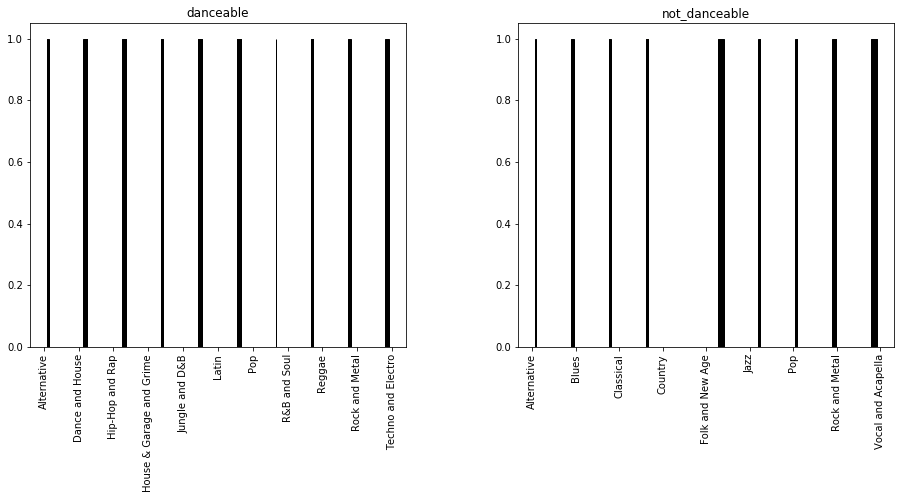

In [31]:
df_tracks.hist('json_directory', class_name, figsize=(15,6), edgecolor="k")

Data distribution based on the genres

In [32]:
df_tracks['json_directory'].value_counts()

Jungle and D&B              22
Latin                       22
Dance and House             21
Hip-Hop and Rap             19
Vocal and Acapella          17
Techno and Electro          16
Folk and New Age            16
Rock and Metal              13
R&B and Soul                13
Reggae                      12
House & Garage and Grime    10
Alternative                  9
Country                      8
Blues                        8
Pop                          7
Jazz                         6
Classical                    6
Name: json_directory, dtype: int64

# Features DF

## Clean the low-level from the unnecessary features and load the rest to a list

Each index/item of the list contains the cleaned dictionary low-level data, flattened by the relevant function

In [33]:
list_feats_tracks = []

In [34]:
list_feats_tracks.clear()  # clear the list if it not empty

counter_items_transformed = 0
for index, row in df_tracks.iterrows():
    f = open(row['track_path'])
    data_feats_item = json.load(f)

    # remove unnecessary data
    if 'metadata' in data_feats_item:
      del data_feats_item['metadata']
    if 'beats_position' in data_feats_item['rhythm']:
      del data_feats_item['rhythm']['beats_position']
    
    # data dictionary transformed to a fully flattened dictionary
    data_feats_item = flatten_dict_full(data_feats_item)

    # append to a full tracks features pandas df
    list_feats_tracks.append(dict(data_feats_item))
    
    counter_items_transformed += 1

print('Items parsed and transformed:', counter_items_transformed)

Items parsed and transformed: 225


In [35]:
len(list_feats_tracks)

225

In [36]:
# list_feats_tracks

## Check a flattened low-level instance and save a sample locally

In [37]:
type(list_feats_tracks[0])

dict

In [38]:
example_dict = list_feats_tracks[0]

In [39]:
df_sample = pd.DataFrame.from_dict(example_dict, orient='index', columns=['low_level_data'])

In [40]:
df_sample.reset_index(level=0, inplace=True)

In [41]:
df_sample.columns = ['low_level_data', 'low_level_values']
df_sample.head()

,low_level_data,low_level_values
0,lowlevel_average_loudness,0.940232
1,lowlevel_barkbands_crest_dmean,2.76666
2,lowlevel_barkbands_crest_dmean2,4.4483
3,lowlevel_barkbands_crest_dvar,5.74581
4,lowlevel_barkbands_crest_dvar2,14.9876


In [42]:
df_sample.to_csv('sample_flattened_low_level_data.csv')

## Transform the low-level features instances to DF

In [43]:
df_feats_tracks = pd.DataFrame(list_feats_tracks, columns=list_feats_tracks[0].keys())

In [44]:
df_feats_tracks.head()

lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0                   0.940232                        2.766660   
1                   0.918468                        2.675291   
2                   0.903639                        2.680212   
3                   0.964146                        2.334805   
4                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.126804                               0.123771   
3                             0.096527                               0.074531   
4                             0.115602                               0.095726   

   lowlevel_barkbands_flatness_db_min  lowlevel_barkbands_flatness_db_var  \
0                            0.040839                            0.010974   
1                            0.025457                            0.001940   
2                            0.045240                  

In [45]:
df_feats_tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Columns: 2651 entries, lowlevel_average_loudness to tonal_key_scale
dtypes: float64(2573), int64(74), object(4)
memory usage: 4.6+ MB


In [46]:
df_feats_tracks.shape

(225, 2651)

## Concatenate the tracks DF with the feats DF

In [47]:
df_tracks.columns

Index(['json_directory', 'track', 'track_path', 'danceability'], dtype='object')

In [48]:
df_tracks.drop(labels=['track_path'], axis=1, inplace=True)

In [49]:
df_full_tracks = pd.concat([df_tracks, df_feats_tracks], axis=1)

In [50]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

## check for empty values

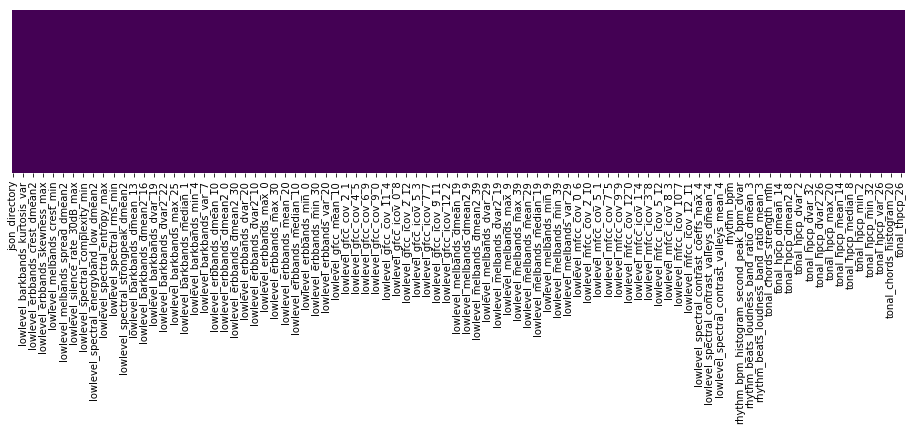

In [51]:
plt.figure(figsize=(16, 3))
sns.heatmap(df_full_tracks.isnull(), yticklabels=False, cbar=False, cmap='viridis')

There are no null values.

## Enumerate

###  check for non numerical values --> categorical data and explore this data

In [52]:
df_full_tracks.shape

(225, 2654)

In [53]:
df_full_tracks.select_dtypes(include=['object']).head()

,json_directory,track,danceability,tonal_chords_key,tonal_chords_scale,tonal_key_key,tonal_key_scale
0,Alternative,02 Happy Birthday - Altered Images.mp3,danceable,A,major,D,minor
1,Alternative,03 How Soon Is Now - Smiths.mp3,not_danceable,F#,major,F#,minor
2,Alternative,04 Pearly Dewdrops' Drops - Cocteau Twins.mp3,not_danceable,D,major,D,major
3,Alternative,06 Mr Brightside - Killers.mp3,danceable,C#,major,C#,major
4,Alternative,06 Song 2 - Blur.mp3,danceable,C,minor,G#,major


In [54]:
df_feats_tracks.select_dtypes(include=['object']).columns

Index(['tonal_chords_key', 'tonal_chords_scale', 'tonal_key_key',
       'tonal_key_scale'],
      dtype='object')

### One-hot encoding to categorical data

In [55]:
df_cat_full_tracks = df_full_tracks[['tonal_chords_key', 'tonal_chords_scale', 'tonal_key_key', 'tonal_key_scale']]

In [56]:
df_cat_full_tracks.head()

,tonal_chords_key,tonal_chords_scale,tonal_key_key,tonal_key_scale
0,A,major,D,minor
1,F#,major,F#,minor
2,D,major,D,major
3,C#,major,C#,major
4,C,minor,G#,major


In [57]:
df_cat_full_tracks_onehot = pd.get_dummies(df_cat_full_tracks)

In [58]:
df_cat_full_tracks_onehot.head()

,tonal_chords_key_A,tonal_chords_key_A#,tonal_chords_key_B,tonal_chords_key_C,tonal_chords_key_C#,tonal_chords_key_D,tonal_chords_key_D#,tonal_chords_key_E,tonal_chords_key_F,tonal_chords_key_F#,tonal_chords_key_G,tonal_chords_key_G#,tonal_chords_scale_major,tonal_chords_scale_minor,tonal_key_key_A,tonal_key_key_A#,tonal_key_key_B,tonal_key_key_C,tonal_key_key_C#,tonal_key_key_D,tonal_key_key_D#,tonal_key_key_E,tonal_key_key_F,tonal_key_key_F#,tonal_key_key_G,tonal_key_key_G#,tonal_key_scale_major,tonal_key_scale_minor
0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
4,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [59]:
df_cat_full_tracks_onehot.columns

Index(['tonal_chords_key_A', 'tonal_chords_key_A#', 'tonal_chords_key_B',
       'tonal_chords_key_C', 'tonal_chords_key_C#', 'tonal_chords_key_D',
       'tonal_chords_key_D#', 'tonal_chords_key_E', 'tonal_chords_key_F',
       'tonal_chords_key_F#', 'tonal_chords_key_G', 'tonal_chords_key_G#',
       'tonal_chords_scale_major', 'tonal_chords_scale_minor',
       'tonal_key_key_A', 'tonal_key_key_A#', 'tonal_key_key_B',
       'tonal_key_key_C', 'tonal_key_key_C#', 'tonal_key_key_D',
       'tonal_key_key_D#', 'tonal_key_key_E', 'tonal_key_key_F',
       'tonal_key_key_F#', 'tonal_key_key_G', 'tonal_key_key_G#',
       'tonal_key_scale_major', 'tonal_key_scale_minor'],
      dtype='object')

In [60]:
len(list(df_cat_full_tracks_onehot.columns))

28

In [61]:
df_cat_full_tracks_onehot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   tonal_chords_key_A        225 non-null    uint8
 1   tonal_chords_key_A#       225 non-null    uint8
 2   tonal_chords_key_B        225 non-null    uint8
 3   tonal_chords_key_C        225 non-null    uint8
 4   tonal_chords_key_C#       225 non-null    uint8
 5   tonal_chords_key_D        225 non-null    uint8
 6   tonal_chords_key_D#       225 non-null    uint8
 7   tonal_chords_key_E        225 non-null    uint8
 8   tonal_chords_key_F        225 non-null    uint8
 9   tonal_chords_key_F#       225 non-null    uint8
 10  tonal_chords_key_G        225 non-null    uint8
 11  tonal_chords_key_G#       225 non-null    uint8
 12  tonal_chords_scale_major  225 non-null    uint8
 13  tonal_chords_scale_minor  225 non-null    uint8
 14  tonal_key_key_A           225 non-null    

In [62]:
df_full_tracks.drop(labels=['tonal_chords_key', 'tonal_chords_scale', 'tonal_key_key', 'tonal_key_scale'], 
                    axis=1, inplace=True)

In [63]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

In [64]:
df_full_tracks = pd.concat([df_full_tracks, df_cat_full_tracks_onehot], axis=1)

In [65]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

### Target class - Label encoding and OneHot Encoding

In [66]:
class_name

'danceability'

#### Target Label Encoding

In [67]:
df_full_tracks['{}_code'.format(class_name)] = df_full_tracks[class_name]

In [68]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

In [69]:
lb_make = LabelEncoder()

In [70]:
df_full_tracks['{}_code'.format(class_name)] = lb_make.fit_transform(df_full_tracks['{}_code'.format(class_name)])

In [71]:
df_full_tracks['{}_code'.format(class_name)].head()

0    0
1    1
2    1
3    0
4    0
Name: danceability_code, dtype: int64

In [72]:
lb_make.classes_

array(['danceable', 'not_danceable'], dtype=object)

In [73]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

#### Target Class - One Hot Encoding

Can be used in Neural Networks, and some sklearn algorithms

In [74]:
df_target_onehot = pd.get_dummies(df_full_tracks[class_name], prefix='oh_{}'.format(class_name), prefix_sep='_')

In [75]:
df_target_onehot.head()

,oh_danceability_danceable,oh_danceability_not_danceable
0,1,0
1,0,1
2,0,1
3,1,0
4,1,0


In [76]:
df_full_tracks = pd.concat([df_full_tracks, df_target_onehot], axis=1)

In [77]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

In [78]:
df_full_tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Columns: 2681 entries, json_directory to oh_danceability_not_danceable
dtypes: float64(2573), int64(75), object(3), uint8(30)
memory usage: 4.6+ MB


# Preprocessing

## Selecting the kind of learning and taking the corresponding features + Cleaning

In [79]:
# train kind: svm, deep_learning, supervised
train_kind = 'svm'

In [80]:
if train_kind is 'svm':
    df_tracks_ml = df_full_tracks.drop(labels=['json_directory', 'track', 
                                               'danceability_code', 
                                               'oh_danceability_danceable', 
                                               'oh_danceability_not_danceable'], axis=1)

In [81]:
df_tracks_ml[class_name].head()

0        danceable
1    not_danceable
2    not_danceable
3        danceable
4        danceable
Name: danceability, dtype: object

In [82]:
df_tracks_ml.head()

danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.126804                               0.123771   
3                             0.096527                               0.074531   
4                             0.115602                               0.095726   

   lowlevel_barkbands_flatness_db_min  lowlevel_barkbands_flatness_db_var  \
0                            0.040839                            0.010974   
1                            0.025457      

In [83]:
df_tracks_ml.tail()

danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
220  not_danceable                   0.678476                        2.198578   
221  not_danceable                   0.561926                        3.101609   
222  not_danceable                   0.060974                        2.740705   
223  not_danceable                   0.896173                        2.632555   
224  not_danceable                   0.524463                        2.603544   

     lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
220                         3.535062                       3.911791   
221                         5.023286                       9.307854   
222                         4.318319                       6.012118   
223                         4.145145                       6.152494   
224                         4.087422                       7.388843   

     lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
220                       10.137813                     26.745327   
221                       24.205755                     26.938499   
222                       14.674892                     26.837055   
223                       14.765494                     26.579720   
224                       17.482500                     26.869596   

     lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
220                      11.469980                        10.717067   
221                      12.002223                        11.091909   
222                      13.512478                        12.828697   
223                      11.451764                        10.711773   
224                      15.667551                        14.965375   

     lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
220                      3.493151                     15.050433   
221                      2.302416                     26.902409   
222                      3.190076                     22.546574   
223                      2.450705                     21.677338   
224                      2.718769                     36.342972   

     lowlevel_barkbands_flatness_db_dmean  \
220                              0.022372   
221                              0.033291   
222                              0.022014   
223                              0.024697   
224                              0.029231   

     lowlevel_barkbands_flatness_db_dmean2  \
220                               0.033693   
221                               0.050609   
222                               0.033471   
223                               0.036521   
224                               0.044140   

     lowlevel_barkbands_flatness_db_dvar  \
220                             0.000485   
221                             0.001376   
222                             0.000429   
223                             0.000726   
224                             0.001195   

     lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
220                              0.001054                            0.551432   
221                              0.003191                            0.540994   
222                              0.000968                            0.577747   
223                              0.001379                            0.547280   
224                              0.002545                            0.542852   

     lowlevel_barkbands_flatness_db_mean  \
220                             0.286948   
221                             0.191282   
222                             0.307051   
223                             0.203676   
224                             0.278363   

     lowlevel_barkbands_flatness_db_median  \
220                               0.283264   
221                               0.177338   
222                               0.304944   
223                               0.192878   
224                               0.284826   

     

In [84]:
df_tracks_ml_cols = df_tracks_ml.columns

## Shuffling with `random`

In [85]:
tracks_ml_shuffle = shuffle_data(ml_data=df_tracks_ml, config=config_data)

In [86]:
type(tracks_ml_shuffle)

numpy.ndarray

In [87]:
tracks_ml_shuffle[:10]

array([['danceable', 0.940232157707, 2.76665973663, ..., 0, 0, 1],
       ['not_danceable', 0.918467640877, 2.67529129982, ..., 0, 0, 1],
       ['not_danceable', 0.903639018536, 2.68021178246, ..., 0, 1, 0],
       ...,
       ['danceable', 0.92886197567, 3.19572782516, ..., 0, 1, 0],
       ['danceable', 0.957799255848, 2.42391991615, ..., 0, 1, 0],
       ['danceable', 0.964145898819, 2.33480453491, ..., 0, 1, 0]],
      dtype=object)

In [88]:
df_tracks_ml_shuffle = pd.DataFrame(data=tracks_ml_shuffle, columns=df_tracks_ml_cols)

In [89]:
df_tracks_ml_shuffle.head()

danceability lowlevel_average_loudness lowlevel_barkbands_crest_dmean  \
0      danceable                  0.940232                        2.76666   
1  not_danceable                  0.918468                        2.67529   
2  not_danceable                  0.903639                        2.68021   
3      danceable                  0.964146                         2.3348   
4      danceable                  0.940232                        2.76666   

  lowlevel_barkbands_crest_dmean2 lowlevel_barkbands_crest_dvar  \
0                          4.4483                       5.74581   
1                         4.37732                       6.21165   
2                         4.37791                       5.71711   
3                           3.876                       6.31428   
4                          4.4483                       5.74581   

  lowlevel_barkbands_crest_dvar2 lowlevel_barkbands_crest_max  \
0                        14.9876                      26.7228   
1                        15.6215                       26.676   
2                        13.7172                      24.4907   
3                        16.6603                      24.0826   
4                        14.9876                      26.7228   

  lowlevel_barkbands_crest_mean lowlevel_barkbands_crest_median  \
0                       10.8071                         9.69134   
1                       8.78984                         8.10821   
2                       8.95885                         8.11677   
3                       7.98967                         7.19391   
4                       10.8071                         9.69134   

  lowlevel_barkbands_crest_min lowlevel_barkbands_crest_var  \
0                      2.79827                      24.1222   
1                        2.419                      12.3851   
2                       2.5383                      14.4556   
3                      2.51051                      11.0312   
4                      2.79827                      24.1222   

  lowlevel_barkbands_flatness_db_dmean lowlevel_barkbands_flatness_db_dmean2  \
0                            0.0237203                             0.0359584   
1                            0.0216702                             0.0338759   
2                            0.0200293                             0.0327077   
3                            0.0170936                             0.0273881   
4                            0.0237203                             0.0359584   

  lowlevel_barkbands_flatness_db_dvar lowlevel_barkbands_flatness_db_dvar2  \
0                         0.000525935                           0.00115798   
1                         0.000391291                           0.00096104   
2                         0.000377692                          0.000948439   
3                         0.000364911                          0.000917768   
4                         0.000525935                           0.00115798   

  lowlevel_barkbands_flatness_db_max lowlevel_barkbands_flatness_db_mean  \
0                           0.627938                            0.176747   
1                           0.448718                            0.113029   
2                           0.291119                            0.126804   
3                           0.561661                           0.0965269   
4                           0.627938                            0.176747   

  lowlevel_barkbands_flatness_db_median lowlevel_barkbands_flatness_db_min  \
0                              0.146083                          0.0408386   
1                              0.105044                          0.0254568   
2                              0.123771                            0.04524   
3                              0.074531                          0.0187596   
4                              0.146083                          0.0408386   

  lowlevel_barkbands_flatness_db_var lowlevel_barkbands_kurtosis_dmean  \
0              

In [90]:
df_tracks_ml_shuffle.tail()

danceability lowlevel_average_loudness lowlevel_barkbands_crest_dmean  \
220      danceable                  0.906572                        3.20273   
221      danceable                  0.651242                        3.33518   
222  not_danceable                  0.485786                        2.20979   
223      danceable                  0.938981                        2.56291   
224      danceable                  0.943465                         2.9432   

    lowlevel_barkbands_crest_dmean2 lowlevel_barkbands_crest_dvar  \
220                         4.82822                       11.2622   
221                         5.28278                       9.40385   
222                         3.49171                       4.30037   
223                         4.17955                       5.80355   
224                         4.42013                       7.79637   

    lowlevel_barkbands_crest_dvar2 lowlevel_barkbands_crest_max  \
220                        22.3531                      26.3775   
221                        21.2444                      26.5299   
222                        10.5666                      26.9088   
223                        14.2892                      25.0613   
224                        16.9549                      26.2531   

    lowlevel_barkbands_crest_mean lowlevel_barkbands_crest_median  \
220                       12.9442                         11.7547   
221                       12.0382                         11.5528   
222                       12.7804                         11.8584   
223                       9.04916                         8.27306   
224                       13.0438                         12.4256   

    lowlevel_barkbands_crest_min lowlevel_barkbands_crest_var  \
220                      1.96093                      45.8179   
221                      1.69621                      38.0698   
222                       3.2836                      23.7456   
223                      2.28385                      14.2892   
224                      2.35392                      23.3728   

    lowlevel_barkbands_flatness_db_dmean  \
220                            0.0283754   
221                            0.0258308   
222                            0.0196565   
223                            0.0269317   
224                            0.0313903   

    lowlevel_barkbands_flatness_db_dmean2 lowlevel_barkbands_flatness_db_dvar  \
220                             0.0401062                         0.000840075   
221                              0.038243                         0.000602694   
222                             0.0287766                         0.000393318   
223                             0.0399924                         0.000636089   
224                             0.0437621                         0.000901095   

    lowlevel_barkbands_flatness_db_dvar2 lowlevel_barkbands_flatness_db_max  \
220                           0.00151385                           0.388177   
221                           0.00123578                           0.432018   
222                          0.000777693                           0.571813   
223                           0.00138001                           0.414085   
224                           0.00187675                           0.457703   

    lowlevel_barkbands_flatness_db_mean lowlevel_barkbands_flatness_db_median  \
220                            0.132093                              0.124046   
221                            0.117857                              0.108733   
222                            0.292364                               0.29793   
223                            0.130097                              0.126733   
224                            0.161421                              0.148657   

    lowlevel_barkbands_flatness_db_min lowlevel_barkbands_flatness_db_var  \
220                          0.0192236                         0.00280457   
221                          0.0161373 

## X and y data

**X data**

In [91]:
X = df_tracks_ml_shuffle.drop(labels=[class_name], axis=1)

In [92]:
X.shape

(225, 2675)

**y data**

In [93]:
y = df_tracks_ml_shuffle[class_name]

In [94]:
X.head()

lowlevel_average_loudness lowlevel_barkbands_crest_dmean  \
0                  0.940232                        2.76666   
1                  0.918468                        2.67529   
2                  0.903639                        2.68021   
3                  0.964146                         2.3348   
4                  0.940232                        2.76666   

  lowlevel_barkbands_crest_dmean2 lowlevel_barkbands_crest_dvar  \
0                          4.4483                       5.74581   
1                         4.37732                       6.21165   
2                         4.37791                       5.71711   
3                           3.876                       6.31428   
4                          4.4483                       5.74581   

  lowlevel_barkbands_crest_dvar2 lowlevel_barkbands_crest_max  \
0                        14.9876                      26.7228   
1                        15.6215                       26.676   
2                        13.7172                      24.4907   
3                        16.6603                      24.0826   
4                        14.9876                      26.7228   

  lowlevel_barkbands_crest_mean lowlevel_barkbands_crest_median  \
0                       10.8071                         9.69134   
1                       8.78984                         8.10821   
2                       8.95885                         8.11677   
3                       7.98967                         7.19391   
4                       10.8071                         9.69134   

  lowlevel_barkbands_crest_min lowlevel_barkbands_crest_var  \
0                      2.79827                      24.1222   
1                        2.419                      12.3851   
2                       2.5383                      14.4556   
3                      2.51051                      11.0312   
4                      2.79827                      24.1222   

  lowlevel_barkbands_flatness_db_dmean lowlevel_barkbands_flatness_db_dmean2  \
0                            0.0237203                             0.0359584   
1                            0.0216702                             0.0338759   
2                            0.0200293                             0.0327077   
3                            0.0170936                             0.0273881   
4                            0.0237203                             0.0359584   

  lowlevel_barkbands_flatness_db_dvar lowlevel_barkbands_flatness_db_dvar2  \
0                         0.000525935                           0.00115798   
1                         0.000391291                           0.00096104   
2                         0.000377692                          0.000948439   
3                         0.000364911                          0.000917768   
4                         0.000525935                           0.00115798   

  lowlevel_barkbands_flatness_db_max lowlevel_barkbands_flatness_db_mean  \
0                           0.627938                            0.176747   
1                           0.448718                            0.113029   
2                           0.291119                            0.126804   
3                           0.561661                           0.0965269   
4                           0.627938                            0.176747   

  lowlevel_barkbands_flatness_db_median lowlevel_barkbands_flatness_db_min  \
0                              0.146083                          0.0408386   
1                              0.105044                          0.0254568   
2                              0.123771                            0.04524   
3                              0.074531                          0.0187596   
4                              0.146083                          0.0408386   

  lowlevel_barkbands_flatness_db_var lowlevel_barkbands_kurtosis_dmean  \
0                          0.0109739                           4.54692   
1                         0.0

In [95]:
# check the dtypes if are all OK
# X.dtypes

In [96]:
y.head()

0        danceable
1    not_danceable
2    not_danceable
3        danceable
4        danceable
Name: danceability, dtype: object

In [97]:
y.tail()

220        danceable
221        danceable
222    not_danceable
223        danceable
224        danceable
Name: danceability, dtype: object

In [98]:
type(y)

pandas.core.series.Series

## Scaling

### Scaling the data

In [99]:
scaler = StandardScaler()

In [100]:
scaler.fit(X)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [101]:
X_norm = scaler.transform(X)

In [102]:
X_norm

array([[ 0.65878378, -0.05743432,  0.00898081, ..., -0.26726124,
        -1.19136679,  1.19136679],
       [ 0.57658186, -0.24123812, -0.07951321, ..., -0.26726124,
        -1.19136679,  1.19136679],
       [ 0.52057597, -0.2313397 , -0.07878369, ..., -0.26726124,
         0.83937206, -0.83937206],
       ...,
       [-1.0576044 , -1.17766788, -1.183763  , ..., -0.26726124,
        -1.19136679,  1.19136679],
       [ 0.65405807, -0.46731862, -0.32610985, ..., -0.26726124,
         0.83937206, -0.83937206],
       [ 0.6709947 ,  0.29771081, -0.02614009, ..., -0.26726124,
        -1.19136679,  1.19136679]])

## PCA-95

### Apply PCA to the data

In [103]:
pca = PCA(n_components=.95)

In [104]:
pca.fit(X_norm)

PCA(copy=True, iterated_power='auto', n_components=0.95, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [105]:
X_pca = pca.transform(X_norm)

In [106]:
X_pca

array([[-5.36250561e+00, -2.23973419e+00, -8.90446714e+00, ...,
        -2.04468103e-02, -1.46296188e-01, -2.29129627e-01],
       [ 4.54361308e+00, -1.29999041e+01,  5.57227979e+00, ...,
         4.31385990e-01, -3.62287079e-01,  2.09859579e-01],
       [-5.72426254e+00, -3.12265968e+01,  7.08084742e+00, ...,
        -1.53905139e+00,  3.49464225e+00,  2.02156379e+00],
       ...,
       [-2.33882461e+01,  1.97663761e+01, -1.61127797e+01, ...,
         8.56451611e+00, -2.12212772e+00, -2.18632273e+00],
       [-4.91098501e+00, -5.23999898e+00, -2.62552356e+00, ...,
         1.96841645e+00,  6.06407200e+00, -3.22490355e+00],
       [ 1.59992488e+01,  1.10132078e+01, -6.42360394e+00, ...,
         5.12979750e-01,  1.20049891e+00, -4.63079377e-01]])

In [107]:
X_pca.shape

(225, 69)

# GridSearch SVM

In [108]:
c_params = config_data.get("grid_C")
c_params = [2 ** x for x in c_params]  # 2**x
print("C values: {}".format(c_params))
gamma_params = config_data.get("grid_gamma")
gamma_params = [2 ** x for x in gamma_params]  # 2**x
print("Gamma values: {}".format(gamma_params))

C values: [0.03125, 0.125, 0.5, 2, 8, 32, 128, 512, 2048]
Gamma values: [8, 2, 0.5, 0.125, 0.03125, 0.0078125, 0.001953125, 0.00048828125]


In [109]:
parameters_grid = {"kernel": config_data.get("grid_kernel"),
                           "C": c_params,
                           "gamma": gamma_params,
                           "class_weight": config_data.get("grid_class_weight")
                           }

In [110]:
from sklearn.svm import SVC

In [111]:
svm = SVC(gamma="auto", probability=True)

In [112]:
from sklearn.model_selection import KFold

In [113]:
# To be used within GridSearch
inner_cv = KFold(n_splits=5,
                 shuffle=False,
                 random_state=None
                )

In [114]:
grid = GridSearchCV(estimator=svm,
                    param_grid=parameters_grid,
                    cv=inner_cv,
                    n_jobs=-1
                )

In [115]:
grid.fit(X_pca, y)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto', kernel='rbf', max_iter=-1,
                           probability=True, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=-1,
             param_grid={'C': [0.03125, 0.125, 0.5, 2, 8, 32, 128, 512, 2048],
                         'class_weight': ['balanced', None],
                         'gamma': [8, 2, 0.5, 0.125, 0.03125, 0.0078125,
                                   0.001953125, 0.00048828125],
                         'kernel': ['poly', 'rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [116]:
grid.best_score_

0.9866666666666667

In [117]:
grid.best_estimator_

SVC(C=0.03125, cache_size=200, class_weight='balanced', coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.001953125, kernel='poly',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

In [118]:
grid.best_params_

{'C': 0.03125,
 'class_weight': 'balanced',
 'gamma': 0.001953125,
 'kernel': 'poly'}

# Evaluation

In [119]:
from sklearn.metrics import confusion_matrix, classification_report

In [120]:
predictions = grid.predict(X_pca)

In [122]:
prob_predictions = grid.predict_proba(X_pca)
prob_predictions = prob_predictions * 100  # multiply * 100 for better resutls

In [123]:
print("Classification Report:")
print("\n{}".format(classification_report(y, predictions)))

Classification Report:

               precision    recall  f1-score   support

    danceable       1.00      1.00      1.00       132
not_danceable       1.00      1.00      1.00        93

     accuracy                           1.00       225
    macro avg       1.00      1.00      1.00       225
 weighted avg       1.00      1.00      1.00       225



In [124]:
print("Confusion matrix:")
print("\n{}".format(confusion_matrix(y, predictions)))

Confusion matrix:

[[132   0]
 [  0  93]]
